<a href="https://colab.research.google.com/github/nannthd/project_AIEngineer/blob/main/coconut_yolov5m.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependencies


In [ ]:
!pip install roboflow

In [33]:
import roboflow
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt roboflow #install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16605, done.
remote: Counting objects: 100% (146/146), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 16605 (delta 50), reused 96 (delta 43), pack-reused 16459
Receiving objects: 100% (16605/16605), 15.32 MiB | 25.35 MiB/s, done.
Resolving deltas: 100% (11349/11349), done.
/content/yolov5/yolov5
Setup complete. Using torch 2.3.0+cu121 (_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40))


#Download Custom Dataset

In [34]:
%cd /content/yolov5

/content/yolov5


In [35]:
from roboflow import Roboflow
rf = Roboflow(api_key="AWtZRbYK04sFZNNZ1t4X")
project = rf.workspace("projectaiengineer").project("test-wh4pl")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to test-1 in yolov5pytorch:: 100%|██████████| 658/658 [00:00<00:00, 6603.24it/s]


In [36]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- coconuts
nc: 1
roboflow:
  license: CC BY 4.0
  project: test-wh4pl
  url: https://universe.roboflow.com/projectaiengineer/test-wh4pl/dataset/1
  version: 1
  workspace: projectaiengineer
test: ../test/images
train: test-1/train/images
val: test-1/valid/images


# Define Model Configuration and Architecture

In [37]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [38]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5m.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.67 # model depth multiple
width_multiple: 0.75 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

In [39]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [40]:
%%writetemplate /content/yolov5/models/custom_yolov5m.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [41]:
# train yolov5s on custom data for ... epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 10 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5m.yaml --weights 'yolov5m.pt' --optimizer SGD --freeze 10 --image-weights --hyp ./data/hyps/hyp.scratch-high.yaml --name yolov5m_results  --cache

/content/yolov5
2024-06-12 09:55:35.972212: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-12 09:55:35.972270: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-12 09:55:35.973603: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=./models/custom_yolov5m.yaml, data=/content/yolov5/test-1/data.yaml, hyp=./data/hyps/hyp.scratch-high.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, ima

# Evaluate Custom YOLOv5 Detector Performance

In [42]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2882), started 0:30:18 ago. (Use '!kill 2882' to kill it.)

<IPython.core.display.Javascript object>

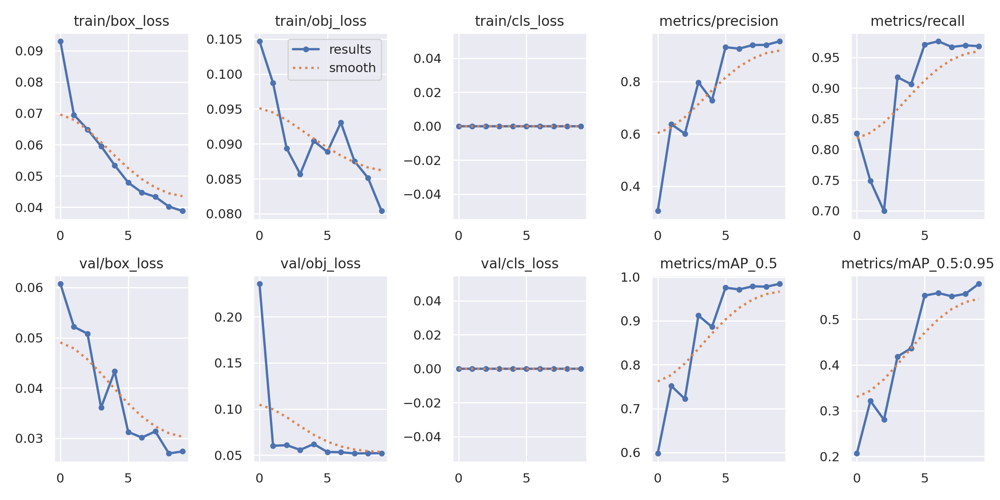

In [43]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results/results.png', width=1000)  # view results.png

##Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


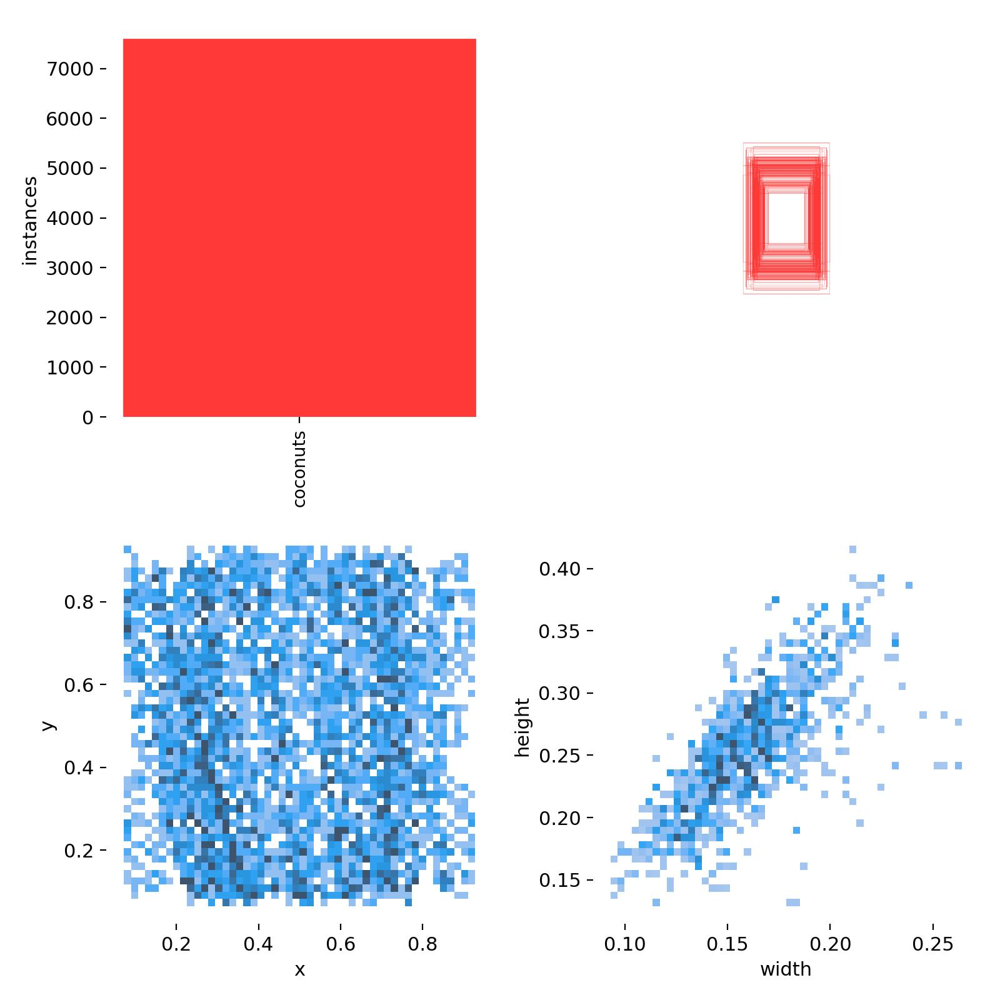

In [44]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


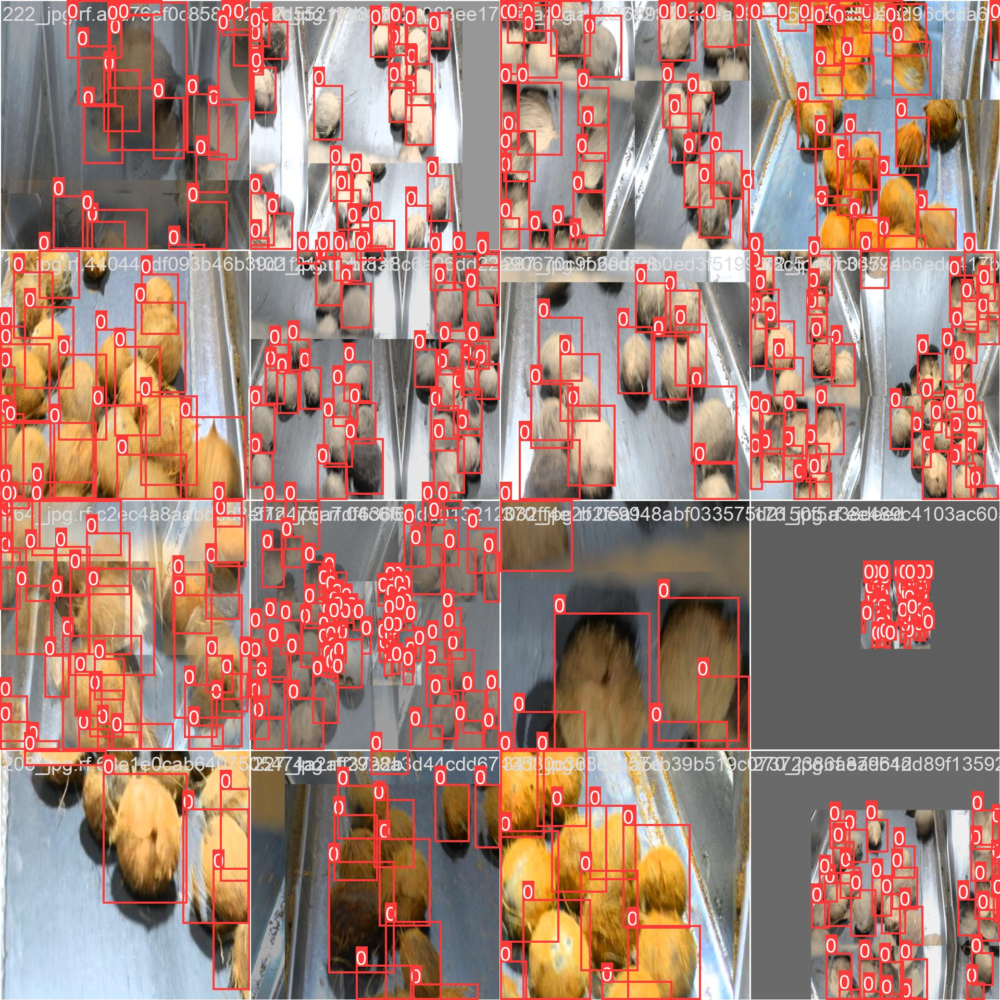

In [45]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights

In [46]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/  val/


In [47]:
%ls runs/train/yolov5m_results/weights

best.pt  last.pt


#ปรับแต่งโมเดล

##val set

In [48]:
val_set_loc = dataset.location + "/valid/images/"

In [49]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5m_results/weights/best.pt --data /content/yolov5/Coconut-tracker-counter-1/data.yaml --img 640 --conf 0.5 --source {val_set_loc} --save-txt

/content/yolov5
detect: weights=['runs/train/yolov5m_results/weights/best.pt'], source=/content/yolov5/test-1/valid/images/, data=/content/yolov5/Coconut-tracker-counter-1/data.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/65 /content/yolov5/test-1/valid/images/100_jpg.rf.a91ea0eeef43520958599392d3da89b9.jpg: 640x640 16 coconutss, 27.0ms
image 2/65 /content/yolov5/test-1/valid/images/116_jpg.rf.7cacb011ae3d88629

In [50]:
%cd /content/yolov5/
!python val.py --data /content/yolov5/Coconut-tracker-counter-1/data.yaml --weights runs/train/yolov5m_results/weights/best.pt --img 640 --iou 0.5 --half

/content/yolov5
val: data=/content/yolov5/Coconut-tracker-counter-1/data.yaml, weights=['runs/train/yolov5m_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.5, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/yolov5/Coconut-tracker-counter-1/valid/labels.cache... 65 images, 0 backgrounds, 0 corrupt: 100% 65/65 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:06<00:00,  2.07s/it]
                   all         65        759      0.955      0.968      0.984      0.577
Speed: 0.4ms pre-process, 38.9ms in

### Update best mAP

In [52]:
!python val.py --data /content/yolov5/Coconut-tracker-counter-1/data.yaml --weights runs/train/yolov5m_results/weights/best.pt --img 640 --iou 0.5 --augment --verbose --half

val: data=/content/yolov5/Coconut-tracker-counter-1/data.yaml, weights=['runs/train/yolov5m_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.5, max_det=300, task=val, device=, workers=8, single_cls=False, augment=True, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/yolov5/Coconut-tracker-counter-1/valid/labels.cache... 65 images, 0 backgrounds, 0 corrupt: 100% 65/65 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:05<00:00,  2.00s/it]
                   all         65        759      0.966      0.955      0.985      0.595
Speed: 0.2ms pre-process, 53.8ms inference, 19.6ms NM

#Export a Trained YOLOv5 Model

In [ ]:
#!python export.py --weights runs/train/yolov5m_results/weights/best.pt --include torchscript onnx

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pickle

# Example data
data = '/content/drive/MyDrive/Chromosome dataset/best.pt'

# Serialize the data and write it to a binary file
with open('best.pkl', 'wb') as file:
    pickle.dump(data, file)

#วัดประสิทธิภาพโมเดล

##test set

In [54]:
import os
import pickle

def convert_labels_to_cache(labels_folder, cache_file):
    labels = []

    # อ่านไฟล์ labels จากโฟลเดอร์
    for filename in os.listdir(labels_folder):
        if filename.endswith(".txt"):
            with open(os.path.join(labels_folder, filename), "r") as file:
                # ดึงข้อมูลจากไฟล์ labels
                # และปรับแต่งตามโครงสร้างข้อมูลที่ต้องการ
                data = {"filename": filename, "content": file.read()}
                labels.append(data)

    # บันทึกข้อมูลลงในไฟล์ .cache
    with open(cache_file, "wb") as cache:
        pickle.dump(labels, cache)

# เรียกใช้ฟังก์ชันแปลงไฟล์ labels เป็น .cache
convert_labels_to_cache("/content/yolov5/Coconut-tracker-counter-1/test/labels", "/content/yolov5/Coconut-tracker-counter-1/test/labels.cache")

In [55]:
test_set_loc = dataset.location + "/test/images/"

In [ ]:
#%cd /content/yolov5/
#!python detect.py --weights runs/train/yolov5m_results/weights/best.pt --data /content/yolov5/Chromosome-v.2-5/data.yaml --img 640 --conf 0.5 --source {test_set_loc} --save-txt

In [56]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5m_results/weights/best.pt --source /content/yolov5/Coconut-tracker-counter-1/test/images --data /content/yolov5/Coconut-tracker-counter-1/data.yaml --imgsz 640 --conf-thres 0.5 --iou-thres 0.45 --max-det 1000 --hide-labels --hide-conf --save-txt --project runs/detect --name exp --exist-ok --line-thickness 1 --half --dnn --vid-stride 1

/content/yolov5
detect: weights=['runs/train/yolov5m_results/weights/best.pt'], source=/content/yolov5/Coconut-tracker-counter-1/test/images, data=/content/yolov5/Coconut-tracker-counter-1/data.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=1, hide_labels=True, hide_conf=True, half=True, dnn=True, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/32 /content/yolov5/Coconut-tracker-counter-1/test/images/10_jpg.rf.6de52a8a5944b1596fa50de5c6b9ca4a.jpg: 640x640 23 coconutss, 13.7ms
image 2/32 /content/yolov5/Coconut-tracker-cou

In [ ]:
import os
from PIL import Image
import glob
from IPython.display import display

# Define the resize_image function
def resize_image(image_path, new_size):
    original_image = Image.open(image_path)
    resized_image = original_image.resize(new_size)
    return resized_image

# Directory containing the test images
image_directory = '/content/yolov5/runs/detect/exp'

# Loop through all JPG files in the directory
for image_path in glob.glob(os.path.join(image_directory, '*.jpg')):
    # Resize the image (options)
    resized_image = resize_image(image_path, new_size=(300, 300))

    # Display the resized image
    display(resized_image)

    # Print a new line
    print("\n")

In [60]:
%mkdir -p /content/yolov5/test/images
%cp -r /content/yolov5/Coconut-tracker-counter-1/test/images* /content/yolov5/test/images/

In [63]:
%mkdir -p /content/yolov5/test/labels
%cp -r /content/yolov5/Coconut-tracker-counter-1/test/labels* /content/yolov5/test/labels/

In [ ]:
%cd /content/yolov5/
!python val.py --data /content/yolov5/test-1/data.yaml --weights runs/train/yolov5m_results/weights/best.pt --img 640 --iou 0.5 --half --task test --save-txt --exist-ok --single-cls

In [ ]:
# ข้อมูลจำนวน TP, FP, และ FN สำหรับข้อมูล 6 ชุด
data = [
    {"TP": 44, "FP": 0, "FN": 2},
    {"TP": 42, "FP": 0, "FN": 4},
    {"TP": 38, "FP": 2, "FN": 8},
    {"TP": 43, "FP": 0, "FN": 3},
    {"TP": 33, "FP": 0, "FN": 13},
    {"TP": 43, "FP": 0, "FN": 3}
]

# คำนวณ Precision, Recall, และค่าเฉลี่ยสำหรับแต่ละภาพ
for i, d in enumerate(data, start=1):
    TP = d["TP"]
    FP = d["FP"]
    FN = d["FN"]

    # Precision
    precision = TP / (TP + FP)

    # Recall
    recall = TP / (TP + FN)

    # แสดงผลลัพธ์สำหรับแต่ละภาพ
    print(f"Image {i}:")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print()

# คำนวณและแสดงค่าเฉลี่ย Precision และ Recall ของข้อมูลทั้งหมด
precisions = [d["TP"] / (d["TP"] + d["FP"]) for d in data]
recalls = [d["TP"] / (d["TP"] + d["FN"]) for d in data]

average_precision = sum(precisions) / len(precisions)
average_recall = sum(recalls) / len(recalls)

print("Average Precision:", average_precision)
print("Average Recall:", average_recall)

# Deploy Model Weights

In [67]:
project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/yolov5/runs/train/yolov5m_results/")

View the status of your deployment at: https://app.roboflow.com/projectaiengineer/test-wh4pl/1
Share your model with the world at: https://universe.roboflow.com/projectaiengineer/test-wh4pl/model/1


In [68]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

running inference on 360_jpg.rf.5c63e0f3931eed6fa4f92e2898b76295.jpg


In [69]:
model.api_key = "rf_Jn6zV8UGLkXXacfPZXuW5AueMzO2"
pred = model.predict(test_set_loc + random_test_image, confidence=50, overlap=30).json()
pred

UnidentifiedImageError: cannot identify image file '/content/yolov5/test-1/test/images/360_jpg.rf.5c63e0f3931eed6fa4f92e2898b76295.jpg'

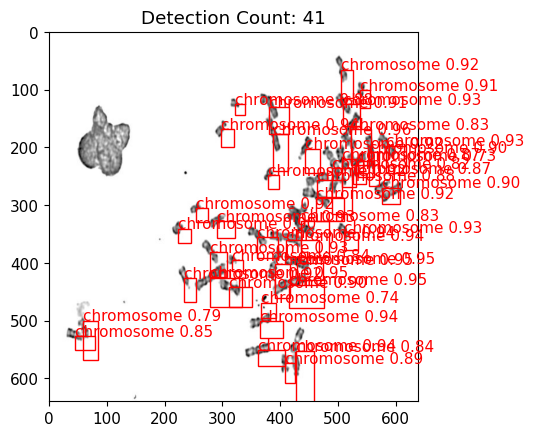

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import requests
from io import BytesIO

# รับข้อมูลการทำนายจาก model.predict
pred = model.predict(test_set_loc + random_test_image, confidence=50, overlap=30).json()

# ฟังก์ชันสำหรับแสดงภาพพร้อม bounding boxes
def show_detection_result(image_path, predictions):
    img = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    detection_count = len(predictions)  # นับจำนวนที่ตรวจจับได้

    for pred in predictions:
        x, y, w, h = pred['x'], pred['y'], pred['width'], pred['height']
        confidence = pred['confidence']
        label = pred['class']

        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y, f'{label} {confidence:.2f}', color='r')

    # แสดงจำนวนที่ตรวจจับได้
    plt.title(f'Detection Count: {detection_count}')
    plt.show()

# แสดงผลลัพธ์การตรวจจับเป็นภาพ
try:
    show_detection_result(pred['predictions'][0]['image_path'], pred['predictions'])
except Exception as e:
    print(f"Error: {e}")

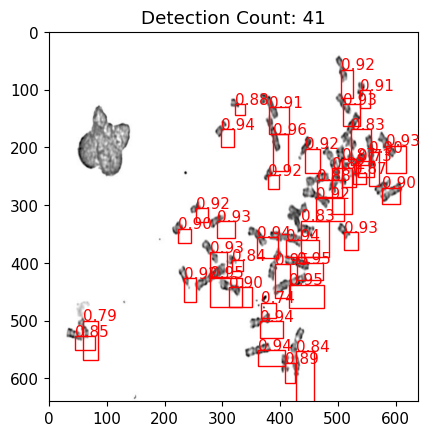

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import requests
from io import BytesIO

# รับข้อมูลการทำนายจาก model.predict
pred = model.predict(test_set_loc + random_test_image, confidence=50, overlap=30).json()

# ฟังก์ชันสำหรับแสดงภาพพร้อม bounding boxes
def show_detection_result(image_path, predictions):
    img = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    detection_count = len(predictions)  # นับจำนวนที่ตรวจจับได้

    for pred in predictions:
        x, y, w, h = pred['x'], pred['y'], pred['width'], pred['height']
        confidence = pred['confidence']
        label = pred['class']

        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # แสดงเฉพาะค่า confidence โดยไม่รวมคำว่า "chromosome"
        ax.text(x, y, f'{confidence:.2f}', color='r')

    # แสดงจำนวนที่ตรวจจับได้
    plt.title(f'Detection Count: {detection_count}')
    plt.show()

# แสดงผลลัพธ์การตรวจจับเป็นภาพ
try:
    show_detection_result(pred['predictions'][0]['image_path'], pred['predictions'])
except Exception as e:
    print(f"Error: {e}")